In [1]:
import numpy as np
import pandas as pd
from pathlib import Path
import os.path
import matplotlib.pyplot as plt
from IPython.display import Image, display, Markdown
import matplotlib.cm as cm
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import tensorflow as tf
from time import perf_counter
import seaborn as sns

def printmd(string):
    # Print with Markdowns    
    display(Markdown(string))


2024-03-28 06:26:21.930546: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-28 06:26:21.930707: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-28 06:26:22.102411: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
image_dir = Path('/kaggle/input/balanced-dataset/balanced_dataset')
# Get filepaths and labels
filepaths = list(image_dir.glob(r'**/*.png'))
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))


In [3]:
filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, labels], axis=1)

# Shuffle the DataFrame and reset index
image_df = image_df.sample(frac=1).reset_index(drop = True)

# Show the result
image_df.head(10)

,Filepath,Label
0,/kaggle/input/balanced-dataset/balanced_datase...,no dr_new
1,/kaggle/input/balanced-dataset/balanced_datase...,severe_new
2,/kaggle/input/balanced-dataset/balanced_datase...,no dr_new
3,/kaggle/input/balanced-dataset/balanced_datase...,no dr_new
4,/kaggle/input/balanced-dataset/balanced_datase...,mild_new
5,/kaggle/input/balanced-dataset/balanced_datase...,moderate_new
6,/kaggle/input/balanced-dataset/balanced_datase...,no dr_new
7,/kaggle/input/balanced-dataset/balanced_datase...,mild_new
8,/kaggle/input/balanced-dataset/balanced_datase...,no dr_new
9,/kaggle/input/balanced-dataset/balanced_datase...,no dr_new


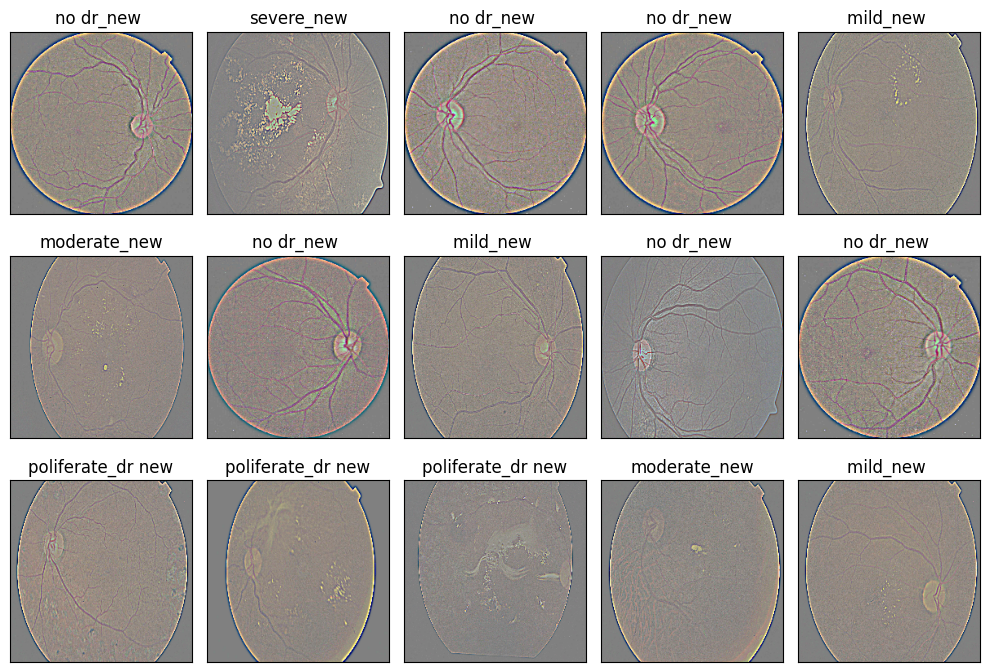

In [4]:
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(10, 7),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Filepath[i]))
    ax.set_title(image_df.Label[i])
plt.tight_layout()
plt.show()

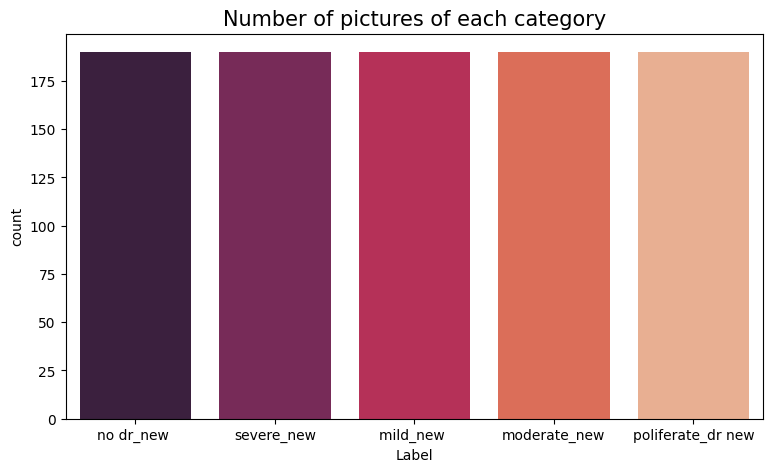

In [5]:
vc = image_df['Label'].value_counts()
plt.figure(figsize=(9,5))
sns.barplot(x = vc.index, y = vc, palette = "rocket")
plt.title("Number of pictures of each category", fontsize = 15)
plt.show()

In [6]:
def create_gen():
    # Load the Images with a generator and Data Augmentation
    train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
        preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
        validation_split=0.1
    )

    test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
        preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input
    )

    train_images = train_generator.flow_from_dataframe(
        dataframe=train_df,
        x_col='Filepath',
        y_col='Label',
        target_size=(224, 224),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        shuffle=True,
        seed=0,
        subset='training',
        rotation_range=30, # Uncomment to use data augmentation
        zoom_range=0.15,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest"
    )

    val_images = train_generator.flow_from_dataframe(
        dataframe=train_df,
        x_col='Filepath',
        y_col='Label',
        target_size=(224, 224),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        shuffle=True,
        seed=0,
        subset='validation',
        rotation_range=30, # Uncomment to use data augmentation
        zoom_range=0.15,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest"
    )

    test_images = test_generator.flow_from_dataframe(
        dataframe=test_df,
        x_col='Filepath',
        y_col='Label',
        target_size=(224, 224),
        color_mode='rgb',
        class_mode='categorical',
        batch_size=32,
        shuffle=False
    )
    
    return train_generator,test_generator,train_images,val_images,test_images

In [7]:
def get_model(model):
# Load the pretained model
    kwargs =    {'input_shape':(224, 224, 3),
                'include_top':False,
                'weights':'imagenet',
                'pooling':'avg'}
    
    pretrained_model = model(**kwargs)
    pretrained_model.trainable = False
    
    inputs = pretrained_model.input

    x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
    x = tf.keras.layers.Dense(128, activation='relu')(x)

    outputs = tf.keras.layers.Dense(5, activation='softmax')(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    
    return model

In [8]:
train_df, test_df = train_test_split(image_df, train_size=0.9, shuffle=True, random_state=1)

In [9]:
models = {
    "DenseNet201": {"model":tf.keras.applications.DenseNet201, "perf":0},
    
    "ResNet50": {"model":tf.keras.applications.ResNet50, "perf":0},
    
    "VGG19": {"model":tf.keras.applications.VGG19, "perf":0},
   
}

# Create the generators
train_generator,test_generator,train_images,val_images,test_images=create_gen()
print('\n')

# Fit the models
for name, model in models.items():
    
    # Get the model
    m = get_model(model['model'])
    models[name]['model'] = m
    
    start = perf_counter()
    
    # Fit the model
    history = m.fit(train_images,validation_data=val_images,epochs=1,verbose=1)
    
    # Sav the duration, the train_accuracy and the val_accuracy
    duration = perf_counter() - start
    duration = round(duration,2)
    models[name]['perf'] = duration
    print(f"{name:20} trained in {duration} sec")
    
    val_acc = history.history['val_accuracy']
    models[name]['val_acc'] = [round(v,4) for v in val_acc]
    
    train_acc = history.history['accuracy']
    models[name]['train_accuracy'] = [round(v,4) for v in train_acc]

Found 770 validated image filenames belonging to 5 classes.
Found 85 validated image filenames belonging to 5 classes.
Found 95 validated image filenames belonging to 5 classes.


74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


25/25 ━━━━━━━━━━━━━━━━━━━━ 167s 6s/step - accuracy: 0.3471 - loss: 1.5459 - val_accuracy: 0.3412 - val_loss: 1.2719
DenseNet201          trained in 168.17 sec
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 90s 3s/step - accuracy: 0.3258 - loss: 1.5754 - val_accuracy: 0.3059 - val_loss: 1.3420
ResNet50             trained in 89.99 sec
80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 305s 12s/step - accuracy: 0.2406 - loss: 1.7212 - val_accuracy: 0.4471 - val_loss: 1.4247
VGG19                trained in 323.84 sec


In [10]:
models_result = []

for name, v in models.items():
    models_result.append([ name, 
                          models[name]['train_accuracy'][-1],
                          models[name]['val_acc'][-1], 
                          models[name]['perf']])
    
df_results = pd.DataFrame(models_result, 
                          columns = ['model','train_accuracy','val_accuracy','Training time (sec)'])
df_results.sort_values(by='val_accuracy', ascending=False, inplace=True)
df_results.reset_index(inplace=True,drop=True)
df_results

,model,train_accuracy,val_accuracy,Training time (sec)
0,VGG19,0.2896,0.4471,323.84
1,DenseNet201,0.3779,0.3412,168.17
2,ResNet50,0.3558,0.3059,89.99


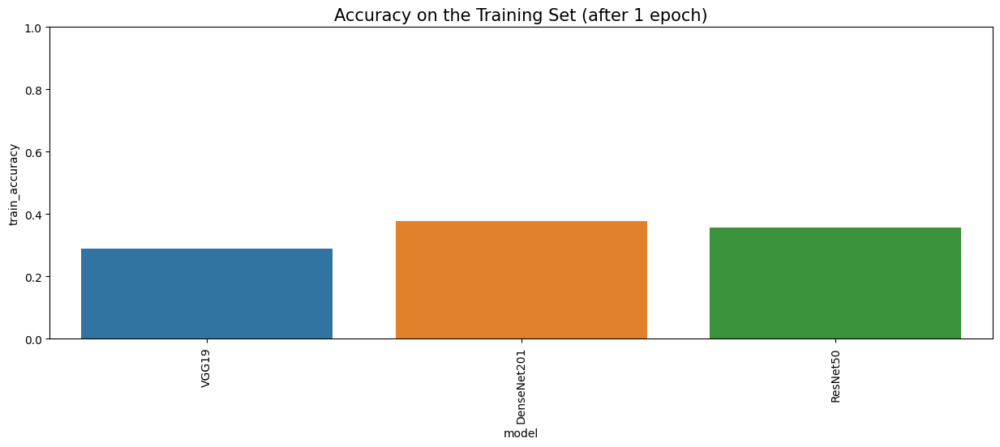

In [11]:
plt.figure(figsize = (15,5))
sns.barplot(x = 'model', y = 'train_accuracy', data = df_results)
plt.title('Accuracy on the Training Set (after 1 epoch)', fontsize = 15)
plt.ylim(0,1)
plt.xticks(rotation=90)
plt.show()

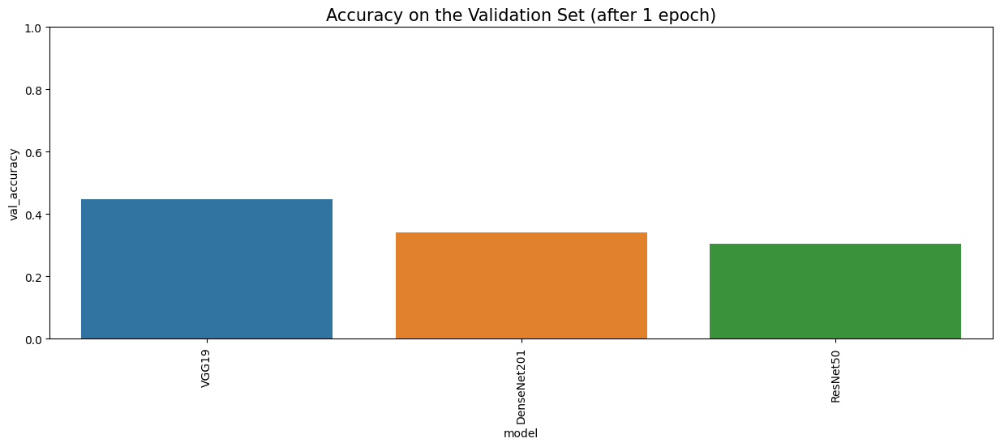

In [12]:
plt.figure(figsize = (15,5))
sns.barplot(x = 'model', y = 'val_accuracy', data = df_results)
plt.title('Accuracy on the Validation Set (after 1 epoch)', fontsize = 15)
plt.ylim(0,1)
plt.xticks(rotation=90)
plt.show()

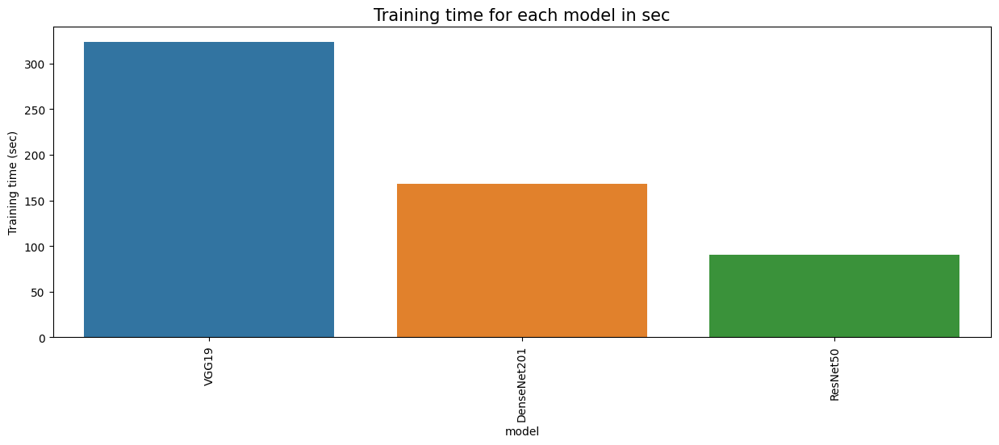

In [13]:
plt.figure(figsize = (15,5))
sns.barplot(x = 'model', y = 'Training time (sec)', data = df_results)
plt.title('Training time for each model in sec', fontsize = 15)
plt.xticks(rotation=90)
plt.show()

# 1. * > **DENSENET 201****

In [14]:
pretrained_model = tf.keras.applications.DenseNet201(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)


pretrained_model.trainable = False

In [15]:
inputs = pretrained_model.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(5, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    validation_data=val_images,
    batch_size = 32,
    epochs=10,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=2,
            restore_best_weights=True
        )
    ]
)

Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 165s 6s/step - accuracy: 0.3257 - loss: 1.5347 - val_accuracy: 0.3294 - val_loss: 1.3261
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 134s 5s/step - accuracy: 0.5057 - loss: 1.3850 - val_accuracy: 0.5412 - val_loss: 1.1040
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 142s 5s/step - accuracy: 0.5655 - loss: 1.0090 - val_accuracy: 0.4941 - val_loss: 1.1341
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 141s 5s/step - accuracy: 0.6265 - loss: 0.9229 - val_accuracy: 0.5412 - val_loss: 1.0504
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 132s 5s/step - accuracy: 0.6267 - loss: 0.9621 - val_accuracy: 0.4588 - val_loss: 1.1646
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 132s 5s/step - accuracy: 0.7065 - loss: 0.7757 - val_accuracy: 0.5765 - val_loss: 1.0631
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 142s 5s/step - accuracy: 0.6873 - loss: 0.7627 - val_accuracy: 0.6000 - val_loss: 1.2223


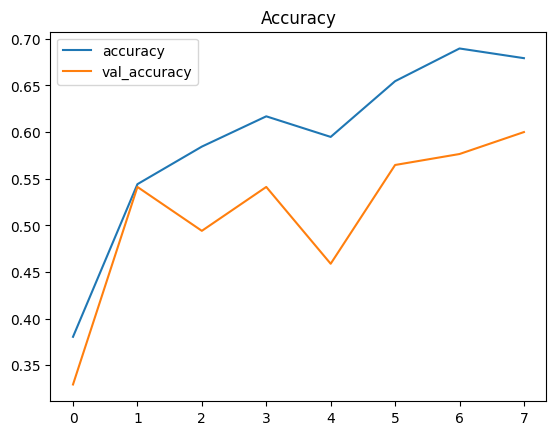

In [16]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

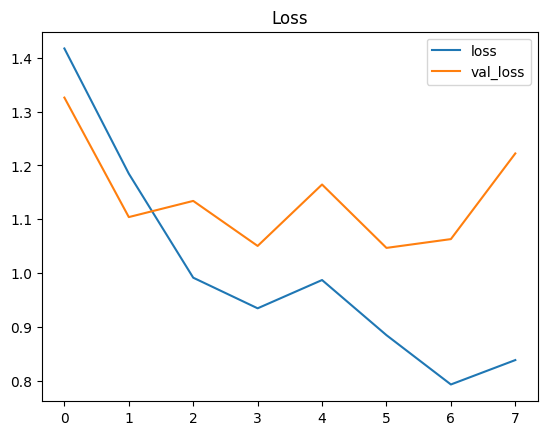

In [17]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()

In [18]:
results = model.evaluate(test_images, verbose=0)


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


In [19]:
printmd(" ## Test Loss: {:.5f}".format(results[0]))
printmd("## Accuracy on the test set: {:.2f}%".format(results[1] * 100))

 ## Test Loss: 0.86931

## Accuracy on the test set: 65.26%

In [ ]:
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

In [ ]:
from sklearn.metrics import classification_report
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (10,6))
sns.heatmap(cf_matrix, annot=True, xticklabels = sorted(set(y_test)), yticklabels = sorted(set(y_test)))
plt.title('Normalized Confusion Matrix')
plt.show()

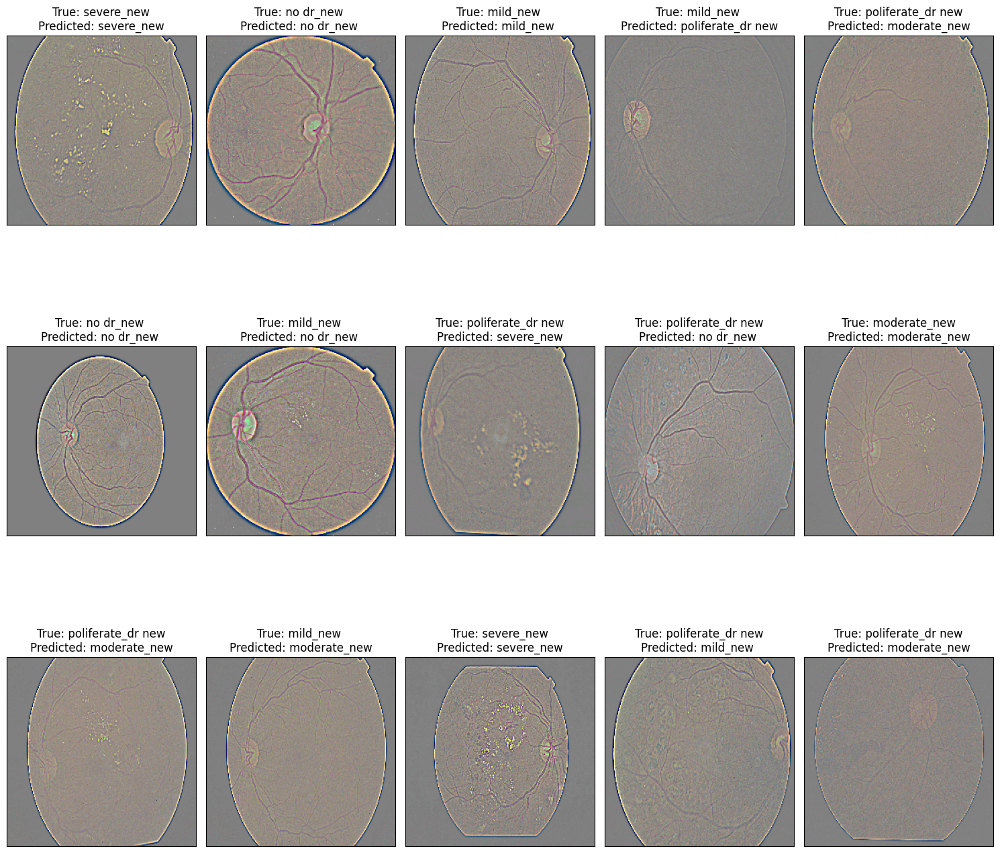

In [46]:
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

# 1. * > **RESNET -- 50 ****

In [ ]:
pretrained_model = tf.keras.applications.ResNet50(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)


pretrained_model.trainable = False

In [ ]:
inputs = pretrained_model.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(5, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    validation_data=val_images,
    batch_size = 32,
    epochs=10,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=2,
            restore_best_weights=True
        )
    ]
)

25/25 ━━━━━━━━━━━━━━━━━━━━ 90s 3s/step - accuracy: 0.2420 - loss: 1.5519 - val_accuracy: 0.3059 - val_loss: 1.3746
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 79s 3s/step - accuracy: 0.3565 - loss: 1.3841 - val_accuracy: 0.2706 - val_loss: 1.5345
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.3499 - loss: 1.3515 - val_accuracy: 0.2824 - val_loss: 1.2872
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.3819 - loss: 1.4163 - val_accuracy: 0.3647 - val_loss: 1.2927
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.3821 - loss: 1.3396 - val_accuracy: 0.4235 - val_loss: 1.2662
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 82s 3s/step - accuracy: 0.3877 - loss: 1.2946 - val_accuracy: 0.4471 - val_loss: 1.2298
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 79s 3s/step - accuracy: 0.3979 - loss: 1.2894 - val_accuracy: 0.5294 - val_loss: 1.2468
Epoch 8/10


In [ ]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

In [ ]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()

In [ ]:
results = model.evaluate(test_images, verbose=0)

In [ ]:
printmd(" ## Test Loss: {:.5f}".format(results[0]))
printmd("## Accuracy on the test set: {:.2f}%".format(results[1] * 100))

In [30]:
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

3/3 ━━━━━━━━━━━━━━━━━━━━ 13s 4s/step
The first 5 predictions: ['mild_new ', 'no dr_new ', 'mild_new ', 'moderate_new', 'mild_new ']


In [31]:
from sklearn.metrics import classification_report
y_test = list(test_df.Label)
print(classification_report(y_test, pred))


                   precision    recall  f1-score   support

        mild_new        0.38      0.65      0.48        20
     moderate_new       0.16      0.43      0.24        14
       no dr_new        0.76      0.76      0.76        17
poliferate_dr new       0.00      0.00      0.00        25
       severe_new       0.57      0.21      0.31        19

         accuracy                           0.38        95
        macro avg       0.38      0.41      0.36        95
     weighted avg       0.36      0.38      0.33        95



/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


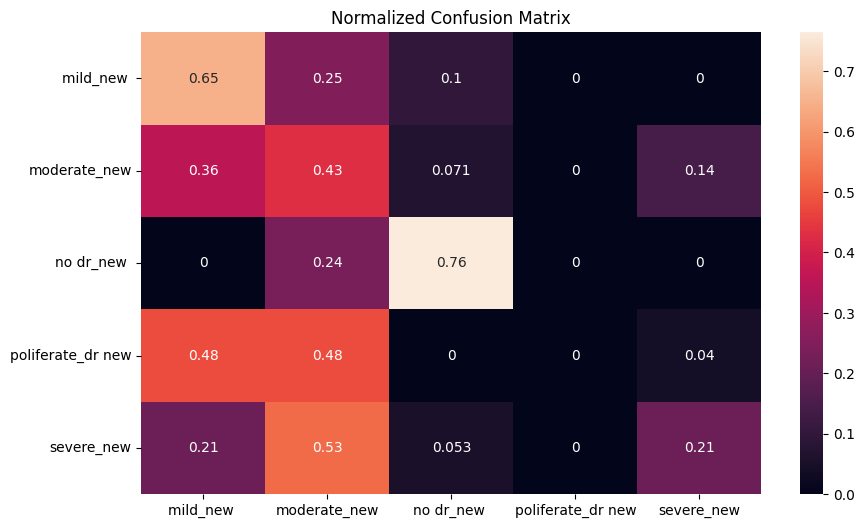

In [32]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (10,6))
sns.heatmap(cf_matrix, annot=True, xticklabels = sorted(set(y_test)), yticklabels = sorted(set(y_test)))
plt.title('Normalized Confusion Matrix')
plt.show()

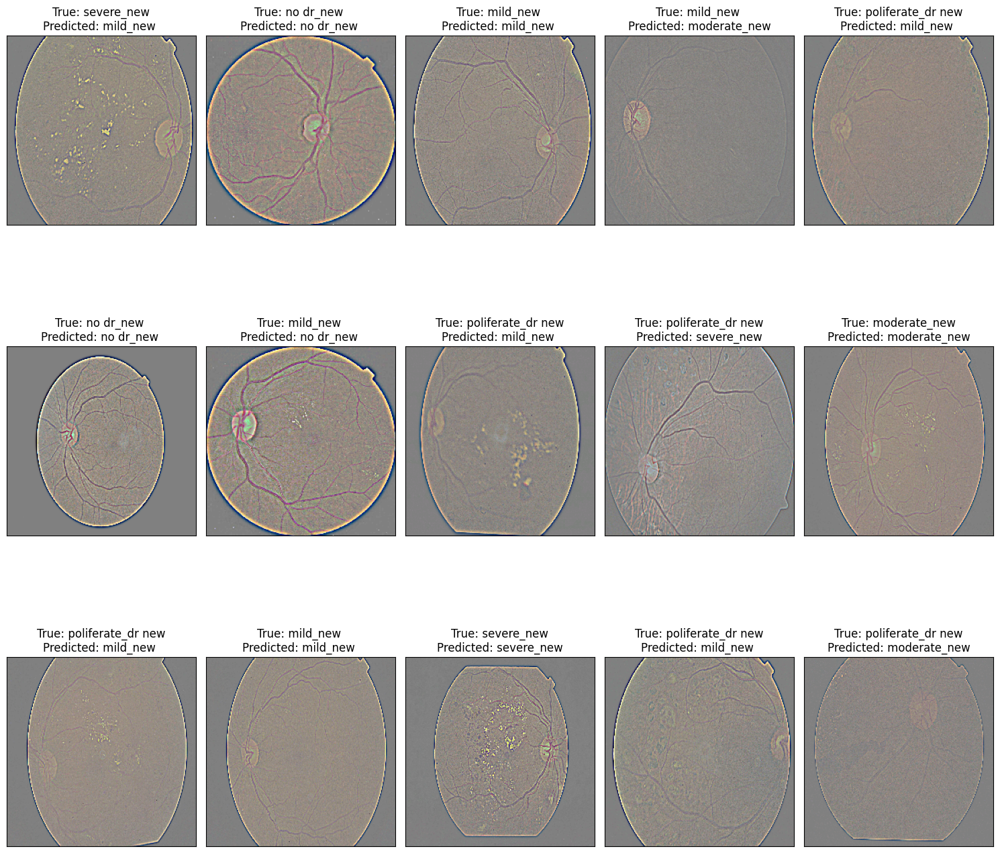

In [33]:
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

# 1. * > **vgg- 19****

In [34]:
pretrained_model = tf.keras.applications.VGG19(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='avg'
)


pretrained_model.trainable = False

In [ ]:
inputs = pretrained_model.input

x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)

outputs = tf.keras.layers.Dense(5, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

history = model.fit(
    train_images,
    validation_data=val_images,
    batch_size = 32,
    epochs=10,
    callbacks=[
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=2,
            restore_best_weights=True
        )
    ]
)

Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 304s 12s/step - accuracy: 0.2477 - loss: 1.6397 - val_accuracy: 0.4353 - val_loss: 1.4135
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 322s 12s/step - accuracy: 0.4271 - loss: 1.3885 - val_accuracy: 0.4118 - val_loss: 1.3456
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 321s 12s/step - accuracy: 0.3908 - loss: 1.3239 - val_accuracy: 0.4235 - val_loss: 1.2880
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 322s 12s/step - accuracy: 0.4774 - loss: 1.2318 - val_accuracy: 0.4706 - val_loss: 1.1634
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 302s 12s/step - accuracy: 0.4769 - loss: 1.2000 - val_accuracy: 0.5294 - val_loss: 1.1020
Epoch 7/10
23/25 ━━━━━━━━━━━━━━━━━━━━ 21s 11s/step - accuracy: 0.4542 - loss: 1.2118

In [ ]:
pd.DataFrame(history.history)[['accuracy','val_accuracy']].plot()
plt.title("Accuracy")
plt.show()

In [ ]:
pd.DataFrame(history.history)[['loss','val_loss']].plot()
plt.title("Loss")
plt.show()


In [38]:
results = model.evaluate(test_images, verbose=0)

In [39]:
printmd(" ## Test Loss: {:.5f}".format(results[0]))
printmd("## Accuracy on the test set: {:.2f}%".format(results[1] * 100))

 ## Test Loss: 1.20076

## Accuracy on the test set: 45.26%

In [40]:
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

3/3 ━━━━━━━━━━━━━━━━━━━━ 34s 11s/step
The first 5 predictions: ['severe_new', 'no dr_new ', 'mild_new ', 'poliferate_dr new', 'moderate_new']


In [41]:
from sklearn.metrics import classification_report
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                   precision    recall  f1-score   support

        mild_new        0.67      0.30      0.41        20
     moderate_new       0.21      0.57      0.31        14
       no dr_new        0.65      1.00      0.79        17
poliferate_dr new       0.00      0.00      0.00        25
       severe_new       0.57      0.63      0.60        19

         accuracy                           0.45        95
        macro avg       0.42      0.50      0.42        95
     weighted avg       0.40      0.45      0.39        95



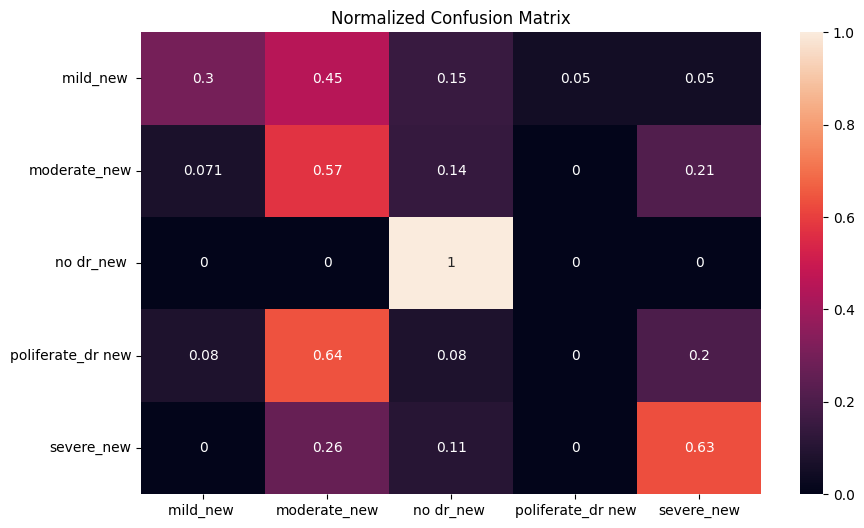

In [42]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cf_matrix = confusion_matrix(y_test, pred, normalize='true')
plt.figure(figsize = (10,6))
sns.heatmap(cf_matrix, annot=True, xticklabels = sorted(set(y_test)), yticklabels = sorted(set(y_test)))
plt.title('Normalized Confusion Matrix')
plt.show()

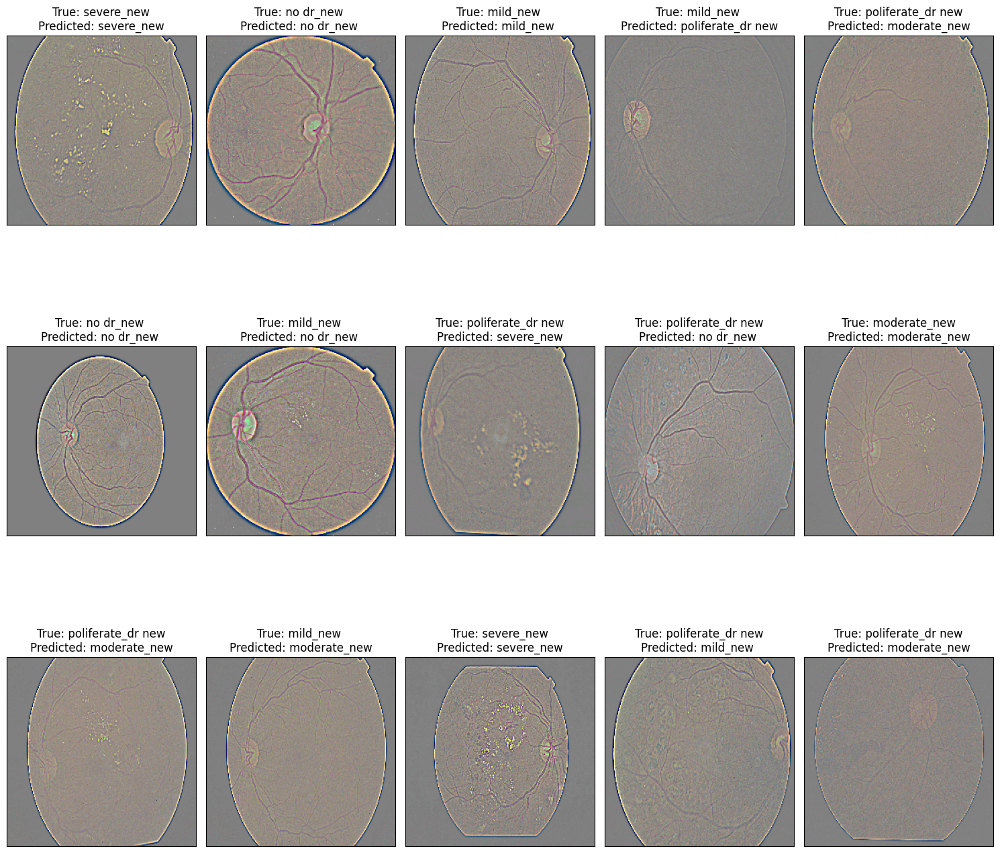

In [43]:
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[i]))
    ax.set_title(f"True: {test_df.Label.iloc[i]}\nPredicted: {pred[i]}")
plt.tight_layout()
plt.show()

In [44]:
results = model.evaluate(test_images, verbose=0)
printmd(" ## Test Loss: {:.5f}".format(results[0]))
printmd("## Accuracy on the test set: {:.2f}%".format(results[1] * 100))

 ## Test Loss: 1.20076

## Accuracy on the test set: 45.26%